In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import anndata as ad
import numpy as np
import pandas as pd

from rich import print
import os

import scvi

import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import colorcet as cc
from icecream import ic

# Set SVG font type to 'none' to keep text as text in SVG files
plt.rcParams["svg.fonttype"] = "none"

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Impor

In [3]:
# from nichevi.spatial_analysis import SpatialAnalysis
from params import setup, niche_setup

In [4]:
sc.set_figure_params(dpi=150, fontsize=12, format="svg")
figure_dir = setup.FIGURES_FOLDER

plots = True

In [5]:
scvi.settings.seed = 34

Seed set to 34


In [6]:
data_dir, data_file = setup.DATA_FOLDER, setup.DATA_FILE

data_file_name = os.path.splitext(data_file)[0]
print(data_file_name)

path_to_save = os.path.join("../../niche-VI-experiments/checkpoints", data_file_name)
os.makedirs(path_to_save, exist_ok=True)

proseg_resolvi_scanvi_xenium_breast_cancer_S1_R1_2

In [7]:
path_to_save

'../../niche-VI-experiments/checkpoints/proseg_resolvi_scanvi_xenium_breast_cancer_S1_R1_2'

In [8]:
# adata = ad.read_h5ad(data_dir + data_file)
adata = ad.read_h5ad(
    path_to_save +'/proseg_resolvi_scanvi_xenium_breast_cancer_S1_R1_2_nicheVI.h5ad'
)

del adata.uns["log1p"]

print(adata)

AnnData object with n_obs × n_vars = 278658 × 313
    obs: 'sample', '_scvi_batch', 'cell_type', '_scvi_labels', 'batch', 'predictions_scanvi', 'x', 'y', 'z', 
'observed_x', 'observed_y', 'observed_z', 'fov', 'probability', 'background', 'confusion', 'n_counts', '_indices', 
'_scvi_ind_x', 'predicted_celltype_resolvi', 'predicted_celltype_prob_resolvi', 'predictions_resolvi_proseg', 
'predictions_resolvi_proseg_coarse', 'predicted_celltype_resolvi_coarse', 'index', 'kmeans_alpha_4', 
'kmeans_alpha_5', 'kmeans_alpha_5_transferred', 'predictions_resolvi_proseg_coarse_corrected', '_scvi_sample'
    var: 'mt'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'neighbors', 'pca', 
'predictions_resolvi_proseg_coarse_corrected_colors', 'umap'
    obsm: 'X_banksy_02_harmony', 'X_pca', 'X_resolvi', 'X_resolvi_MDE', 'X_resolvi_proseg', 'X_scANVI', 
'X_scANVI_MDE', 'X_scanvi', 'X_spatial', 'X_umap', 'banksy_pc_20_lambda_0.0', 'banksy_pc_20_lambda_0.2', 
'celltype_transfer_resolvi', 'distance_neighbor', 'index_neighbor', 
'ln_s10_w400_scanvi_lr0.0005_poisson_X_nicheVI', 'ln_s20_w400_scanvi_lr0.0005_poisson_X_nicheVI', 
'mog_ln_s20_w400_scanvi_lr0.0005_poisson_X_nicheVI', 'neighborhood_composition', 'niche_composition', 
'niche_distances', 'niche_indexes', 'observed_spatial', 'qz1_m', 'qz1_m_niche_ct', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'counts_wo_bg'
    obsp: 'connectivities', 'distances'

In [9]:
from sklearn.preprocessing import MinMaxScaler

adata.layers["counts_log1p"] = adata.layers["counts"].copy()
sc.pp.log1p(adata, layer="counts_log1p")

# adata.layers["standard_scaled"] = adata.layers["counts_log1p"].copy()
# sc.pp.scale(adata, max_value=None, layer="standard_scaled")

adata.layers["min_max_scaled"] = MinMaxScaler().fit_transform(
    adata.layers["counts_log1p"].toarray()
)

adata.layers["min_max_scaled_raw"] = MinMaxScaler().fit_transform(
    adata.layers["counts"].toarray()
)

In [10]:
adata_not_endo = adata[adata.obs[setup.CELL_TYPE] != 'Endothelial'].copy()

In [11]:
adata_astro = adata[adata.obs[setup.CELL_TYPE] == "Endothelial"].copy()
# del adata_astro.uns["log1p"]

print(adata_astro)

AnnData object with n_obs × n_vars = 16054 × 313
    obs: 'sample', '_scvi_batch', 'cell_type', '_scvi_labels', 'batch', 'predictions_scanvi', 'x', 'y', 'z', 
'observed_x', 'observed_y', 'observed_z', 'fov', 'probability', 'background', 'confusion', 'n_counts', '_indices', 
'_scvi_ind_x', 'predicted_celltype_resolvi', 'predicted_celltype_prob_resolvi', 'predictions_resolvi_proseg', 
'predictions_resolvi_proseg_coarse', 'predicted_celltype_resolvi_coarse', 'index', 'kmeans_alpha_4', 
'kmeans_alpha_5', 'kmeans_alpha_5_transferred', 'predictions_resolvi_proseg_coarse_corrected', '_scvi_sample'
    var: 'mt'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'neighbors', 'pca', 
'predictions_resolvi_proseg_coarse_corrected_colors', 'umap', 'log1p'
    obsm: 'X_banksy_02_harmony', 'X_pca', 'X_resolvi', 'X_resolvi_MDE', 'X_resolvi_proseg', 'X_scANVI', 
'X_scANVI_MDE', 'X_scanvi', 'X_spatial', 'X_umap', 'banksy_pc_20_lambda_0.0', 'banksy_pc_20_lambda_0.2', 
'celltype_transfer_resolvi', 'distance_neighbor', 'index_neighbor', 
'ln_s10_w400_scanvi_lr0.0005_poisson_X_nicheVI', 'ln_s20_w400_scanvi_lr0.0005_poisson_X_nicheVI', 
'mog_ln_s20_w400_scanvi_lr0.0005_poisson_X_nicheVI', 'neighborhood_composition', 'niche_composition', 
'niche_distances', 'niche_indexes', 'observed_spatial', 'qz1_m', 'qz1_m_niche_ct', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'counts_wo_bg', 'counts_log1p', 'min_max_scaled', 'min_max_scaled_raw'
    obsp: 'connectivities', 'distances'

# HOTSPOT

In [13]:
import hotspot

# latent_obsm_key = "ln_s10_w400_scanvi_lr0.0005_poisson_X_nicheVI"
# latent_obsm_key = "X_scanvi"
latent_obsm_key = setup.COORDS

adata_astro.layers["counts_csc"] = adata_astro.layers["counts"].tocsc()
hs = hotspot.Hotspot(
    adata_astro,
    layer_key="counts_csc",
    model="danb",
    latent_obsm_key=latent_obsm_key,
    # umi_counts_obs_key="total_counts"
)

hs.create_knn_graph(
    weighted_graph=False,
    n_neighbors=30,
)

hs_results = hs.compute_autocorrelations(jobs=-1)
hs_results.head(15)

adata_astro.uns[f"results_{latent_obsm_key}"] = hs_results.loc[hs_results.FDR < 0.05]

100%|██████████| 313/313 [00:00<00:00, 742.80it/s]


In [14]:
# Select the genes with significant lineage autocorrelation
hs_genes = hs_results.loc[hs_results.FDR < 0.05].sort_values("Z", ascending=False).index

# Compute pair-wise local correlations between these genes
lcz = hs.compute_local_correlations(hs_genes, jobs=-1)

modules = hs.create_modules(min_gene_threshold=15, core_only=True, fdr_threshold=0.05)

module_scores = hs.calculate_module_scores()

# Convert all column names to strings
module_scores.columns = module_scores.columns.map(str)


hs.results.join(hs.modules)
adata_astro.obsm[f"modules_scores{latent_obsm_key}"] = module_scores
adata_astro.uns[f"results_{latent_obsm_key}"] = hs_results.join(hs.modules).loc[
    hs_results.FDR < 0.05
]

modules.value_counts()

Computing pair-wise local correlation on 216 features...


100%|██████████| 23220/23220 [00:10<00:00, 2143.47it/s]


Computing scores for 5 modules...


100%|██████████| 5/5 [00:00<00:00, 13.04it/s]


Module
-1    75
 1    50
 3    28
 2    25
 5    23
 4    15
Name: count, dtype: int64

In [15]:
# Get the maximum score and its column for each row
max_scores = adata_astro.obsm[f"modules_scores{latent_obsm_key}"].max(axis=1)
max_columns = adata_astro.obsm[f"modules_scores{latent_obsm_key}"].idxmax(axis=1)

WEAK_THRESHOLD = 0.5

# Apply the condition: keep the column name if max score > 1, else set it to 'weak'
adata_astro.obs["max_module"] = np.where(
    max_scores > WEAK_THRESHOLD, max_columns, "weak"
)

adata_astro.write_h5ad(path_to_save + "/xenium_breast_cancer_S1_R1_2_nicheVI_CD8.h5ad")

adata_astro.obs["max_module"].value_counts()

max_module
1       4672
2       3673
weak    3435
4       1777
3       1269
5       1228
Name: count, dtype: int64

In [16]:
adata_astro.uns[f"results_{latent_obsm_key}"]

,C,Z,Pval,FDR,Module
Gene,,,,,
ESM1,0.136226,84.691598,0.000000,0.000000,1.0
KDR,0.122870,78.062478,0.000000,0.000000,1.0
AQP1,0.126799,76.148198,0.000000,0.000000,2.0
PTGDS,0.117846,64.788226,0.000000,0.000000,2.0
TCIM,0.106109,64.527854,0.000000,0.000000,1.0
...,...,...,...,...,...
ABCC11,0.003710,2.022266,0.021574,0.031853,5.0
TCF7,0.003574,1.952747,0.025425,0.037361,-1.0
C1QA,0.003810,1.950150,0.025579,0.037412,3.0


In [17]:
module_cols = []
for c in adata_astro.obsm[f"modules_scores{latent_obsm_key}"].columns:
    key = f"Module {c}"
    adata_astro.obs[key] = adata_astro.obsm[f"modules_scores{latent_obsm_key}"][c]
    module_cols.append(key)

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


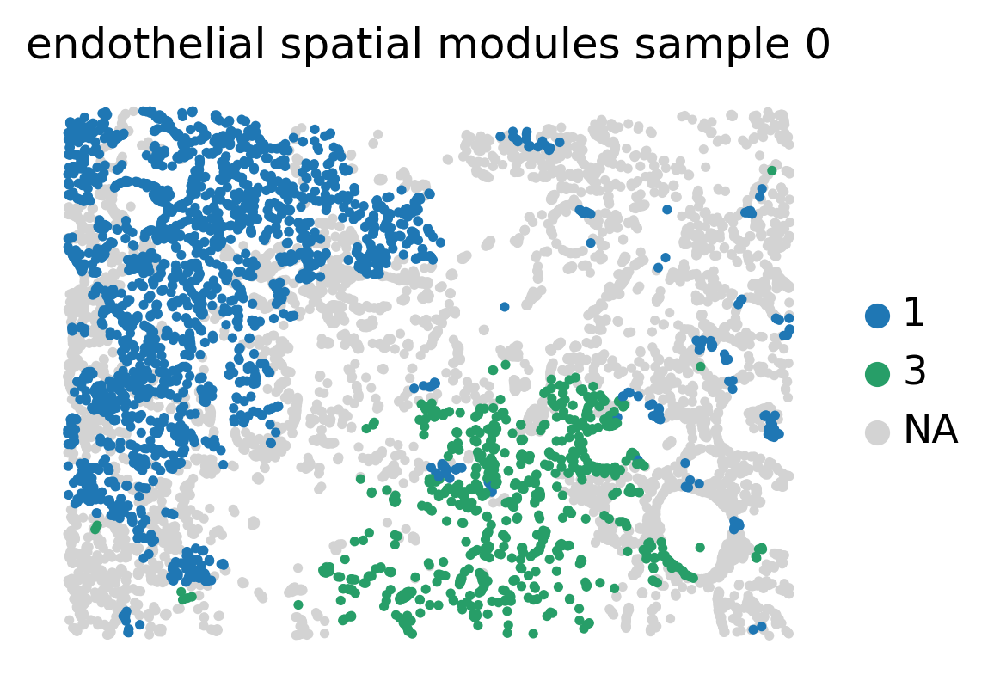

In [18]:
for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    sc.pl.spatial(
        adata_astro[adata_astro.obs[setup.SAMPLE] == sample],
        spot_size=100,
        color=["max_module"],
        # color=["leide /n_03"],
        ncols=4,
        frameon=False,
        title=f"endothelial spatial modules sample {sample}",
        # groups=["2", "6"],
        groups=["1", "3"],
        # palette=cc.glasbey_dark,
        show=False,
        use_raw=False,
        wspace=0.4,
        vmax="p96",
    )
    # plt.savefig(
    #     f"{figure_dir}endothelial_stromal_invasive_proseg.png",
    #     bbox_inches="tight",
    #     dpi=1000,
    # )
    # plt.savefig(
    #     f"{figure_dir}endothelial_stromal_invasive_proseg.svg",
    #     bbox_inches="tight",
    #     dpi=1000,
    # )

In [29]:
# Step 1: Calculate the global 96th percentile for vmax
global_vmax = adata_astro.obs[module_cols].stack().quantile(0.98)

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


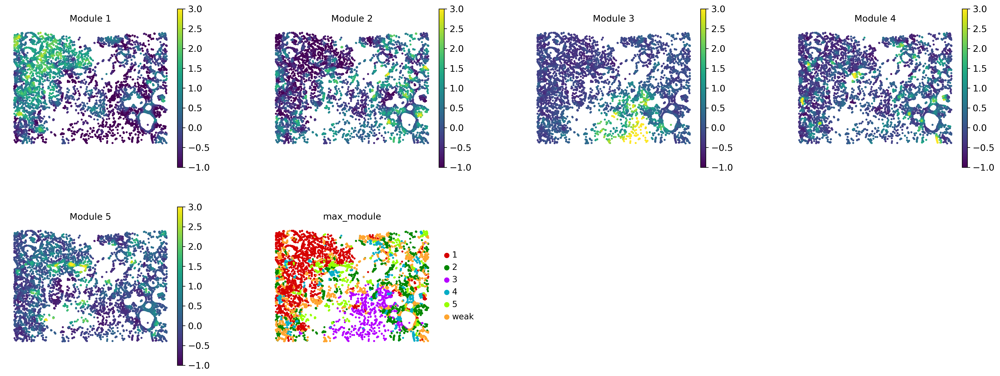

In [19]:
for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    sc.pl.spatial(
        adata_astro[adata_astro.obs[setup.SAMPLE] == sample],
        spot_size=100,
        # color=[setup.NICHE] + module_cols + ["max_module"],
        color=module_cols + ["max_module"],
        ncols=4,
        frameon=False,
        # title=f"endothelial spatial modules {sample}",
        palette=cc.glasbey_light,
        show=False,
        use_raw=False,
        wspace=0.4,
        vmin=-1,
        # vmax=global_vmax,
        vmax=3,

    )
    # plt.savefig(
    #     f"{figure_dir}endothelial_spatial_modules_proseg.png",
    #     bbox_inches="tight",
    #     dpi=1000,
    # )
    # plt.savefig(
    #     f"{figure_dir}endothelial_spatial_modules_proseg.svg",
    #     bbox_inches="tight",
    #     dpi=1000,
    # )

In [20]:
# Show the top genes for a module

module = 1

results = hs.results.join(hs.modules)
results = results.loc[results.Module == module]

results.sort_values("Z", ascending=False).head(20)

,C,Z,Pval,FDR,Module
Gene,,,,,
ESM1,0.136226,84.691598,0.000000e+00,0.000000e+00,1.0
KDR,0.122870,78.062478,0.000000e+00,0.000000e+00,1.0
TCIM,0.106109,64.527854,0.000000e+00,0.000000e+00,1.0
BTNL9,0.078539,57.786862,0.000000e+00,0.000000e+00,1.0
CCND1,0.092174,54.240981,0.000000e+00,0.000000e+00,1.0
EDNRB,0.066395,48.197075,0.000000e+00,0.000000e+00,1.0
RAMP2,0.061413,37.914362,0.000000e+00,0.000000e+00,1.0
ZEB1,0.056454,35.850654,8.981964e-282,1.041242e-280,1.0
PRDM1,0.054150,35.053284,1.737454e-269,1.942226e-268,1.0


In [21]:
module_6 = [
    "CEACAM6",
    "SFRP1",
    "SFRP4",
    "KRT14",
    "ANKRD30A",
    "TACSTD2",
    "OPRPN",
    "S100A14",
    "MLPH",
    "KRT15",
    "TFAP2A",
    "AGR3",
    "KRT6B",
    "KRT5",
    "DSP",
    "CLDN4",
    "CDH1",
    "TPD52",
    "KLF5",
    "ESR1",
]

In [34]:
# for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
#     sc.pl.spatial(
#         adata_astro[adata_astro.obs[setup.SAMPLE] == sample],
#         spot_size=100,
#         color=module_6,
#         ncols=5,
#         frameon=False,
#         # title=f"endothelial spatial modules {sample}",
#         palette=cc.glasbey_light,
#         show=False,
#         use_raw=False,
#         wspace=0.4,
#         vmax="p96",
#     )

# nicheDE

In [22]:
if setup.EXPRESSION_MODEL == "scanvi":
    scvivae = scvi.model.SCANVI.load(
        dir_path=path_to_save
        + f"/{setup.EXPRESSION_MODEL}vae_E"
        + str(setup.N_EPOCHS_SCVI)
        + "_"
        + str(setup.LIKELIHOOD)
        + ".pt",
        adata=adata,
        accelerator="cpu",
    )
if setup.EXPRESSION_MODEL == "scvi":
    scvivae = scvi.model.SCVI.load(
        dir_path=path_to_save
        + f"/{setup.EXPRESSION_MODEL}vae_E"
        + str(setup.N_EPOCHS_SCVI)
        + "_"
        + str(setup.LIKELIHOOD)
        + ".pt",
        adata=adata,
        accelerator="cpu",
    )

INFO     File                                                                                                      
         ../../niche-VI-experiments/checkpoints/proseg_resolvi_scanvi_xenium_breast_cancer_S1_R1_2/scanvivae_E1001_
         poisson.pt/model.pt already downloaded                                                                    


In [23]:
MODEL = "ln_s10_w400_scanvi_lr0.0005_poisson"

In [25]:
from nichevi import nicheSCVI
# from scvi.external import nicheSCVI
# from nichevi.differential_expression import plot_DE_results, _fdr_de_prediction
# from scvi.external.nichevi.differential_expression import plot_DE_results

model = MODEL

path_to_save_nichevae = (
    path_to_save + "/nichevae_" + model + "_" + str(setup.N_EPOCHS_NICHEVI) + ".pt"
)

nichevae = nicheSCVI.load(
    dir_path=path_to_save_nichevae,
    adata=adata,
    accelerator="cpu",
)

INFO     File                                                                                                      
         ../../niche-VI-experiments/checkpoints/proseg_resolvi_scanvi_xenium_breast_cancer_S1_R1_2/nichevae_ln_s10_
         w400_scanvi_lr0.0005_poisson_1001.pt/model.pt already downloaded                                          


In [26]:
adata.obs["max_module"] = "Unknown"
adata.obs.loc[adata.obs[setup.CELL_TYPE] == "Endothelial", "max_module"] = (
    adata_astro.obs["max_module"]
)

In [27]:
adata.obs.max_module.value_counts()

max_module
Unknown    262604
1            4672
2            3673
weak         3435
4            1777
3            1269
5            1228
Name: count, dtype: int64

In [28]:
delta_niches = 0.03
delta_markers = 0.15
DELTA = [delta_niches, delta_markers, delta_niches, delta_niches]
FDR = 0.2
G1 = "1"
G2 = "3"
PSEUDO = 1e-4
N_SAMPLES_DE = 1e5

DE_1_3 = nichevae.differential_expression(
    adata,
    # groupby="kmeans_alpha_5",
    groupby="max_module",
    group1=G1,
    group2=G2,
    batch_correction=False,
    radius=None,
    k_nn=6,
    delta=DELTA,
    niche_mode=True,
    n_samples_overall=N_SAMPLES_DE,
    fdr_target=FDR,
    # weights="importance",
    pseudocounts=PSEUDO,
)


DE_3_1 = nichevae.differential_expression(
    adata,
    # groupby="kmeans_alpha_5",
    groupby="max_module",
    group1=G2,
    group2=G1,
    batch_correction=False,
    radius=None,
    k_nn=6,
    delta=DELTA,
    niche_mode=True,
    n_samples_overall=N_SAMPLES_DE,
    fdr_target=FDR,
    # weights="importance",
    pseudocounts=PSEUDO,
)

Computing adjusted nearest neighbors...

Using all 2 samples
Mean number of neighbors: 3.3 ± 2.1


Computing DE...

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

Running DE for group1_group2

Running DE for group1_neighbors1

Running DE for neighbors1_group2

Running DE for neighbors1_neighbors2

Computing g1 confidence scores...

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__alpha is close to the specified upper bound 1.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 10.0. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Computing DE...

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

Running DE for group1_group2

Running DE for group1_neighbors1

Running DE for neighbors1_group2

Running DE for neighbors1_neighbors2

Computing g1 confidence scores...

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__alpha is close to the specified upper bound 1.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 10.0. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


In [29]:
PROBA_TRES  = 0.75
PLOT_MARGIN = 0.2

g1_markers = DE_1_3.gpc.y_
g2_markers = DE_3_1.gpc.y_

In [30]:
DE_1_3.gpc.X_

,lfc_median,lfc_median
ADH1B,-4.821453,-4.606106
AKR1C3,-1.009221,-3.409387
SFRP1,-2.325528,-2.144601
ESM1,3.733766,-1.881700
TCIM,1.143552,-0.793210
...,...,...
CCL20,-0.089183,1.531709
TMEM147,-0.001493,0.092634
APOBEC3A,-0.022617,0.575203
PDCD1,-0.080316,0.183311


In [31]:
g1_markers.sum(), g2_markers.sum()

(79, 70)

## DE_1_3 analysis

In [32]:
DE_1_3.gpc_info()

Training score:  0.9913793103448276

Marginal likelihood:  -15.57529352308657

Kernel:  31.6**2 * RationalQuadratic(alpha=1, length_scale=10)

In [33]:
DE_1_3.g1_g2[
    g1_markers & (DE_1_3.g1_g2["lfc_median"] > 0) & DE_1_3.g1_g2[f"is_de_fdr_{FDR}"]
][["lfc_median", "proba_de", "proba_de_g1_n1"]].sort_values(
    by="lfc_median", ascending=False
)

,lfc_median,proba_de,proba_de_g1_n1
ESM1,3.733766,0.83633,0.996427
PRDM1,1.353008,0.81498,0.897159
KDR,1.224501,0.77562,0.995058
TCIM,1.143552,0.83050,0.991224
SNAI1,1.018414,0.76881,0.999504
DUSP5,1.000219,0.82915,0.345088
CDC42EP1,0.833604,0.82121,0.997380
ZEB1,0.716000,0.77510,0.999414
DNTTIP1,0.369279,0.79343,0.533805


In [34]:
DE_1_3.g1_g2[
    g1_markers
    & (DE_1_3.g1_g2["lfc_median"] > 0)
    & (DE_1_3.g1_g2["proba_de"] > PROBA_TRES)
    & (DE_1_3.g1_g2["proba_de_g1_n1"] > 0.9)
][["lfc_median", f"is_de_fdr_{FDR}", "proba_de", "proba_de_g1_n1"]].sort_values(
    by="lfc_median", ascending=False
).index

Index(['ESM1', 'KDR', 'TCIM', 'NDUFA4L2', 'SNAI1', 'CDC42EP1', 'ZEB1',
       'DAPK3'],
      dtype='object')

In [35]:
g1_g3_genes_xenium = [
    "SQLE",
    "ESM1",
    "CCDC6",
    "PTRHD1",
    "PCLAF",
    "CCND1",
    "TCIM",
    "TRAF4",
    "SMS",
    "HMGA1",
    "NARS",
    "FOXA1",
    "CDC42EP1",
    "CENPF",
    "THAP2",
    "KDR",
    "POLR2J3",
    "SRPK1",
    "KRT7",
    "SERHL2",
    "DNTTIP1",
    "TOP2A",
    "DMKN",
    "VOPP1",
    "TUBA4A",
    "PRDM1",
    "MYO5B",
    "ABCC11",
    "ADAM9",
    "SNAI1",
    "EIF4EBP1",
    "SCD",
    "MKI67",
    "CTTN",
    "TFAP2A",
    "JUP",
    "SH3YL1",
    "DAPK3",
    "NDUFA4L2",
    "OCIAD2",
    "DUSP5",
    "ZEB1",
    "CD9",
    "SEC24A",
    "MDM2",
    "RAMP2",
    "GJB2",
    "GATA3",
    "OXTR",
    "FASN",
    "ENAH",
]

In [36]:
len(g1_g3_genes_xenium)

51

ic| g1_markers.loc[g1_g3_genes].sum(): 12
ic| len(g1_g3_genes) - g1_markers.loc[g1_g3_genes].sum(): 7
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessClassifier was fitted with feature names
  warnings.warn(


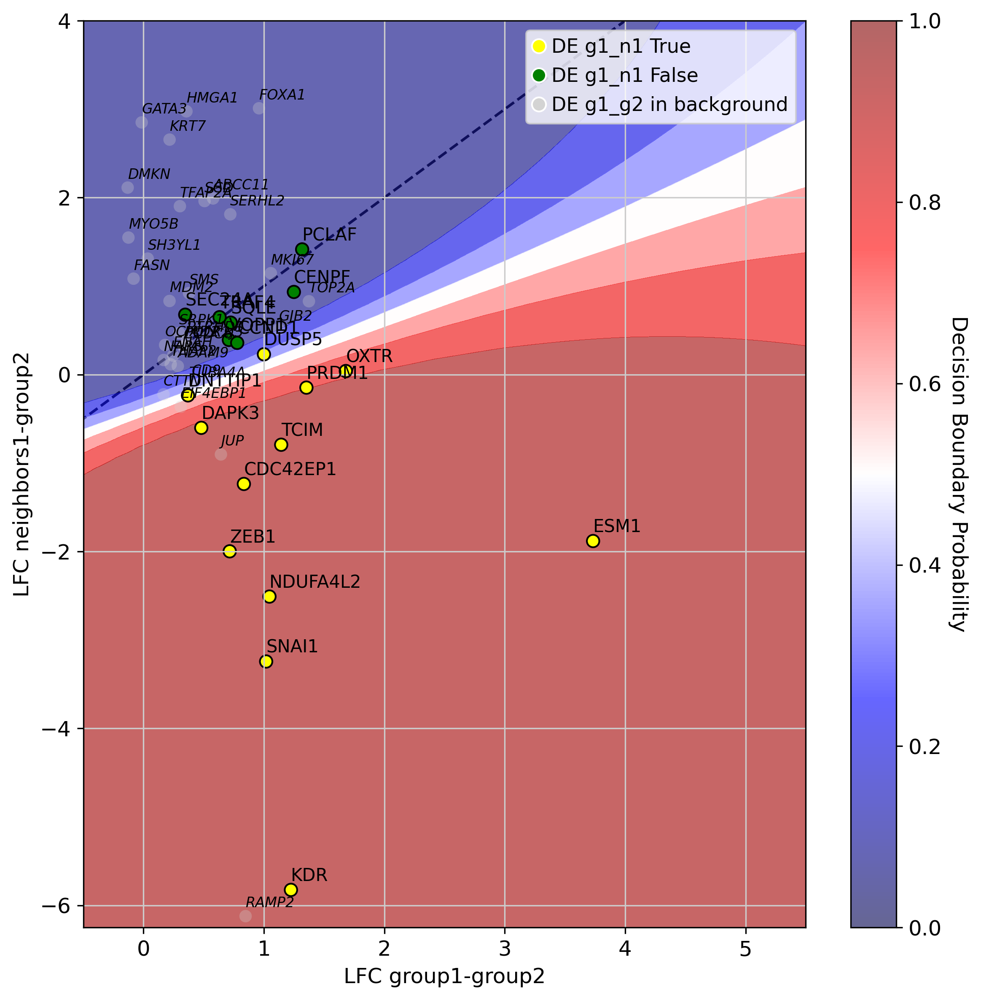

In [ ]:
# g1_g3_genes = DE_1_3.g1_g2[
#     (DE_1_3.g1_g2["lfc_median"] > 0) & DE_1_3.g1_g2[f"is_de_fdr_{FDR}"]
# ].index

g1_g3_genes = DE_1_3.g1_g2[
    (DE_1_3.g1_g2["lfc_median"] > 0) & (DE_1_3.g1_g2['proba_de'] > PROBA_TRES)
].index

background_g1_g3 = list(set(g1_g3_genes_xenium) - set(g1_g3_genes))

ic(g1_markers.loc[g1_g3_genes].sum())
ic(len(g1_g3_genes) - g1_markers.loc[g1_g3_genes].sum())
DE_1_3.plot(
    filter=g1_g3_genes,
    background_filter=background_g1_g3,
    # path_to_save=f"{setup.FIGURES_2DE_FOLDER}scatter_DE_proseg.svg",
    margin=PLOT_MARGIN,
    manual_limits=(-0.5, 5.5, -6.25, 4),
)

In [38]:
yellow_genes_g1_g2 = DE_1_3.gpc.confident_genes
blue_genes_g1_g2 = list(set(g1_g3_genes) - set(yellow_genes_g1_g2))

In [39]:
blue_genes_g1_g2

['PCLAF', 'CCND1', 'SEC24A', 'TRAF4', 'VOPP1', 'SQLE', 'CENPF']

In [40]:
DE_1_3.g1_g2[
    g1_markers
    & (DE_1_3.g1_g2["lfc_median"] > 0)
    & (DE_1_3.g1_g2["proba_de"] > PROBA_TRES)
    & (DE_1_3.g1_g2["proba_de_g1_n1"] > 0.8)
][["lfc_median", f"is_de_fdr_{FDR}", "proba_de", "proba_de_g1_n1"]].sort_values(
    by="lfc_median", ascending=False
).index


Index(['ESM1', 'OXTR', 'PRDM1', 'KDR', 'TCIM', 'NDUFA4L2', 'SNAI1', 'CDC42EP1',
       'ZEB1', 'DAPK3'],
      dtype='object')

In [41]:
g1_g3_genes

Index(['ESM1', 'TCIM', 'DUSP5', 'CDC42EP1', 'PRDM1', 'SQLE', 'VOPP1', 'TRAF4',
       'PCLAF', 'DNTTIP1', 'CCND1', 'KDR', 'ZEB1', 'SNAI1', 'OXTR', 'DAPK3',
       'SEC24A', 'NDUFA4L2', 'CENPF'],
      dtype='object')

In [42]:
len(g1_g3_genes)

19

In [43]:
yellow_genes_g1_g2 = g1_markers.loc[g1_g3_genes].values
blue_genes_g1_g2 = list(set(g1_g3_genes) - set(yellow_genes_g1_g2))

DE_1_3.gpc.confident_genes

Index(['ESM1', 'TCIM', 'DUSP5', 'CDC42EP1', 'PRDM1', 'DNTTIP1', 'KDR', 'ZEB1',
       'SNAI1', 'OXTR', 'DAPK3', 'NDUFA4L2'],
      dtype='object')

In [47]:
def get_gene_percentiles_list(adata, gene_list, p, layer=None):
    """
    Calculate the p-percentile of gene expression for a list of genes in an AnnData object.

    Parameters:
        adata (AnnData): The AnnData object containing expression data.
        gene_list (list): List of gene names for which to compute percentiles.
        p (float): Percentile to compute (between 0 and 100).
        layer (str or None): The layer from which to retrieve expression data.
                             If None, uses `adata.X`.

    Returns:
        list: A list of p-percentile values for the genes, in the same order as gene_list.
              If a gene is not found, its value will be `None`.
    """
    percentiles = []

    for gene in gene_list:
        if gene in adata.var_names:
            if layer:
                data = adata[:, gene].layers[layer].flatten()
            else:
                data = adata[:, gene].X.flatten()

            # Compute the percentile
            percentiles.append(np.percentile(data, p))
        else:
            percentiles.append(None)  # Handle genes not in adata.var_names

    return percentiles

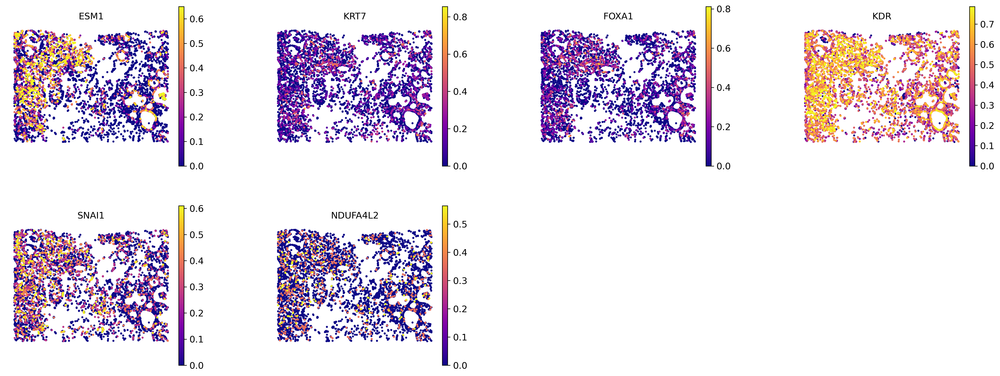

In [49]:
plot_endo = True
gene_list_invasive = ["ESM1",
            "KRT7",
            "FOXA1",
            "KDR",
            "SNAI1",
            'NDUFA4L2'
]
percentiles_invasive = get_gene_percentiles_list(
    adata, gene_list_invasive, 99.9, layer="min_max_scaled"
)

for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    sc.pl.spatial(
        adata=adata_astro[adata_astro.obs[setup.SAMPLE] == sample]
        if plot_endo
        else adata_not_endo[adata_not_endo.obs[setup.SAMPLE] == sample],
        spot_size=100 if plot_endo else 40,
        # color=g3_g1_genes,
        color=gene_list_invasive,
        frameon=False,
        show=False,
        use_raw=False,
        wspace=0.4,
        vmax=percentiles_invasive,
        # vmax="p99.5",
        layer="min_max_scaled",
        cmap="plasma",
    )

    # if plot_endo:
    #     plt.savefig(f"{figure_dir}_proseg_endo.svg", bbox_inches="tight", dpi=1000)
    # else:
    #     plt.savefig(f"{figure_dir}_proseg_not_endo.svg", bbox_inches="tight", dpi=1000)

In [18]:
adata.obs.reset_index(inplace=True)

In [69]:
adata.obs

,level_0,sample,_scvi_batch,cell_type,_scvi_labels,batch,predictions_scanvi,x,y,z,...,predictions_resolvi_proseg_coarse,predicted_celltype_resolvi_coarse,index,kmeans_alpha_4,kmeans_alpha_5,kmeans_alpha_5_transferred,predictions_resolvi_proseg_coarse_corrected,_scvi_sample,max_module,_scvi_raw_norm_scaling
0,query_0_0,0,0,ignore,14,Query-proseg,Stromal,2059.881240,662.993973,18.194250,...,Stromal,Stromal,0,1,Invasive tumor niche,Invasive tumor niche,Stromal,0,Unknown,36.900369
1,query_1_0,0,0,ignore,3,Query-proseg,DCIS_1,5657.111815,2859.304036,29.979532,...,DCIS,DCIS,1,2,DCIS tumor niche,DCIS tumor niche,DCIS,0,Unknown,17.761989
2,query_2_0,0,0,ignore,3,Query-proseg,Invasive_Tumor,239.199285,1922.463590,13.693648,...,DCIS,Invasive_Tumor,2,0,Peri-tumor area,Peri-tumor area,DCIS,0,Unknown,27.397260
3,query_3_0,0,0,ignore,14,Query-proseg,Stromal,2764.965787,2145.892846,22.930703,...,Stromal,Stromal,3,0,"Intact tissue, stromal area","Intact tissue, stromal area",Stromal,0,Unknown,25.773196
4,query_4_0,0,0,ignore,3,Query-proseg,DCIS_1,6972.206706,2666.503934,36.855132,...,DCIS,DCIS,4,2,DCIS tumor niche,DCIS tumor niche,DCIS,0,Unknown,58.139535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
278653,query_118183_1,1,1,ignore,0,Query-proseg,B_Cells,5468.989286,645.657017,33.817276,...,B_Cells,B_Cells,278653,0,Peri-tumor area,"Intact tissue, stromal area",B_Cells,1,Unknown,277.777778
278654,query_118184_1,1,1,ignore,1,Query-proseg,CD4+_T_Cells,733.408232,1086.403800,18.876864,...,CD4+_T_Cells,CD4+_T_Cells,278654,0,Peri-tumor area,Peri-tumor area,CD4+_T_Cells,1,Unknown,344.827586
278655,query_118185_1,1,1,ignore,14,Query-proseg,DCIS_1,825.905755,2960.324773,24.571741,...,Stromal,Stromal,278655,0,Peri-tumor area,Peri-tumor area,Stromal,1,Unknown,250.000000
278656,query_118186_1,1,1,ignore,6,Query-proseg,Unlabeled,339.515425,1831.116915,18.695902,...,Invasive_Tumor,Invasive_Tumor,278656,0,Peri-tumor area,Peri-tumor area,Invasive_Tumor,1,Unknown,769.230769


In [70]:
# Annotate groups
adata.obs["group"] = "other"  # Default category
adata.obs.loc[DE_1_3.n1_index, "group"] = "N1"
adata.obs.loc[DE_1_3.n2_index, "group"] = "N2"

In [71]:
adata.obs.index = adata.obs['level_0']

/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


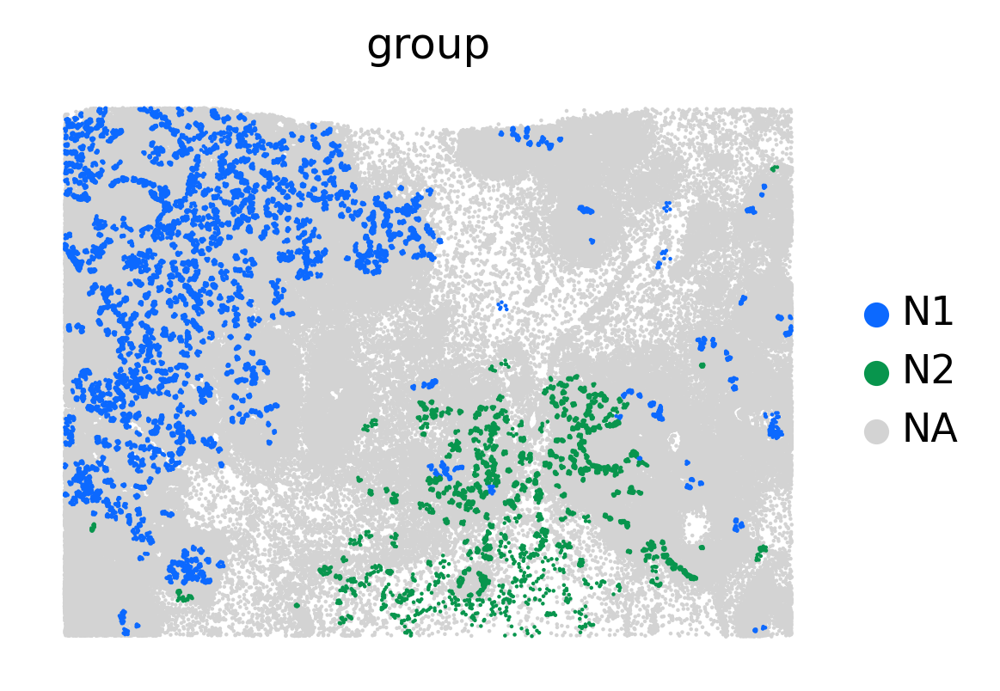

In [72]:
# adata_endo = adata[adata.obs[setup.CELL_TYPE].isin(["Endothelial"])].copy()

for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    sc.pl.spatial(
        adata[adata.obs[setup.SAMPLE] == sample],
        spot_size=40,
        color=["group"],
        groups=["N1", "N2"],
        # groups=["N1"],
        ncols=4,
        frameon=False,
        palette=cc.glasbey_cool,
        # palette="tab20",
        show=False,
        use_raw=False,
        wspace=0.4,
        vmax="p96",
        sort_order=True,
    )

    plt.savefig(f"{figure_dir}_endo_neighbors.svg", bbox_inches="tight", dpi=1000)

In [73]:
print(f"{figure_dir}_endo_neighbors.svg")

/home/nathanl/niche-VI-experiments/breast_cancer/figures_journal_endo_neighbors.svg

## DE_3_1 analysis

In [150]:
DE_3_1.g1_g2[
    g2_markers & (DE_3_1.g1_g2["lfc_median"] > 0) & DE_3_1.g1_g2[f"is_de_fdr_{FDR}"]
][["lfc_median", "proba_de", "proba_de_g1_n1"]].sort_values(
    by="lfc_median", ascending=False
)

,lfc_median,proba_de,proba_de_g1_n1
TIMP4,2.710999,0.89107,0.927208
EDN1,1.578400,0.84197,0.999993
PDK4,1.396527,0.95298,0.254814
BTNL9,1.364256,0.78866,1.000000
AKR1C1,1.311156,0.85781,0.950033
ANKRD29,1.189959,0.81382,0.999999
CLDN5,1.048465,0.73448,1.000000
AKR1C3,0.997124,0.88165,0.991314
NCAM1,0.856018,0.74665,0.998841
AQP1,0.724066,0.72553,1.000000


In [149]:
DE_3_1.g1_g2[
    g2_markers
    & (DE_3_1.g1_g2["lfc_median"] > 0)
    & (DE_3_1.g1_g2["proba_de"] > PROBA_TRES)
][["lfc_median", f"is_de_fdr_{FDR}", "proba_de", "proba_de_g1_n1"]].sort_values(
    by="lfc_median", ascending=False
)

,lfc_median,is_de_fdr_0.2,proba_de,proba_de_g1_n1
TIMP4,2.710999,True,0.89107,0.927208
PDK4,1.396527,True,0.95298,0.254814
AKR1C1,1.311156,True,0.85781,0.950033
AKR1C3,0.997124,True,0.88165,0.991314
CRHBP,0.211368,True,0.87506,0.107328


In [44]:
g3_g1_genes_xenium = [
    "ADH1B",
    "PTGDS",
    "SFRP1",
    "AKR1C3",
    "PDK4",
    "EDN1",
    "CSF3",
    "CTH",
    "ANKRD29",
    "CCDC80",
    "FGL2",
    "DPT",
    "MMP12",
    "CLDN5",
    "AKR1C1",
    "CAVIN2",
    "FBLN1",
    "IL2RA",
    "CD14",
    "NCAM1",
    "IGF1",
    "C1QA",
    "PGR",
    "KRT23",
    "PIGR",
    "CD163",
    "PDCD1LG2",
    "MRC1",
    "GZMK",
    "ALDH1A3",
    "CXCL12",
    "CD79A",
    "FCER1A",
    "OPRPN",
    "UCP1",
    "TRIB1",
    "ADIPOQ",
    "DSC2",
    "KRT5",
    "BANK1",
    "LEP",
    "KRT6B",
    "MEDAG",
    "EGFR",
    "GNLY",
    "CTSG",
    "SERPINA3",
]

ic| g2_markers.loc[g3_g1_genes].sum(): 6
ic| len(g3_g1_genes) - g2_markers.loc[g3_g1_genes].sum(): 14
/home/nathanl/miniforge3/envs/scvi/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessClassifier was fitted with feature names
  warnings.warn(


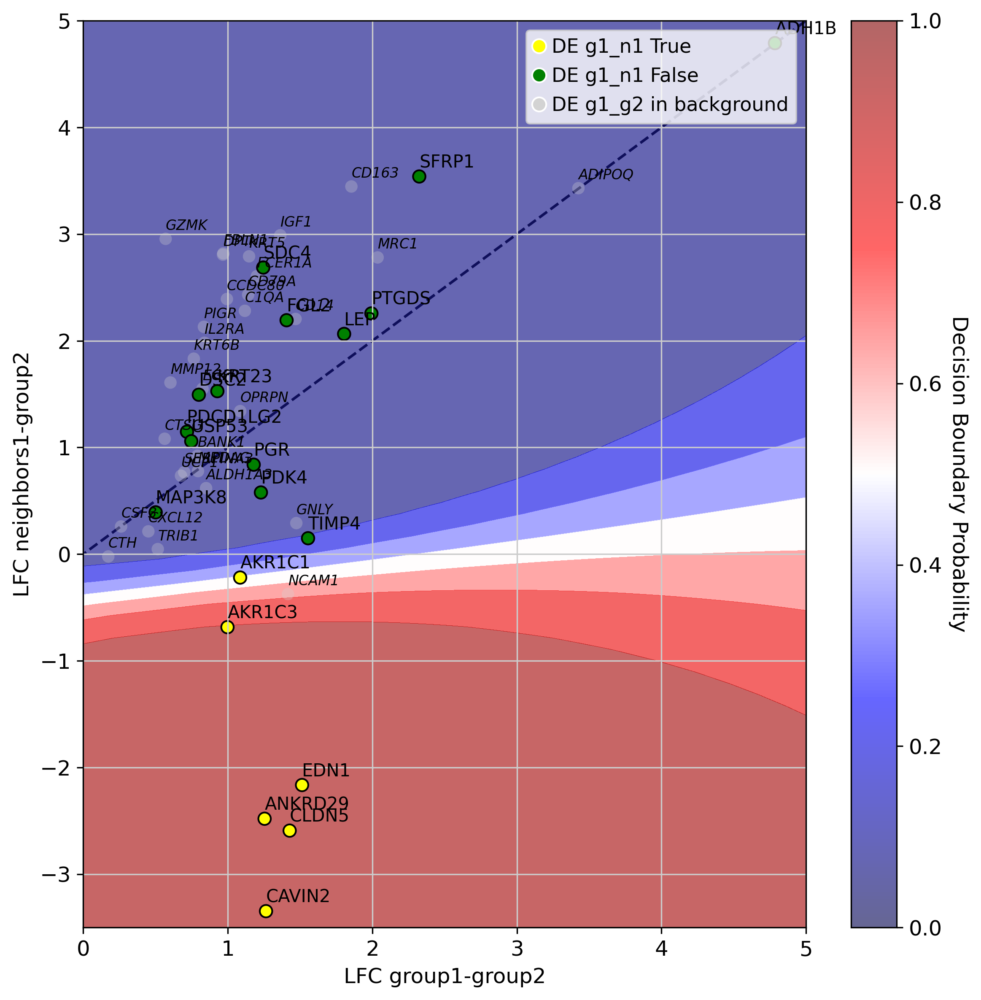

In [ ]:
# g3_g1_genes = DE_3_1.g1_g2[
#     (DE_3_1.g1_g2["lfc_median"] > 0) & DE_3_1.g1_g2[f"is_de_fdr_{FDR}"]
# ].index

g3_g1_genes = DE_3_1.g1_g2[
    (DE_3_1.g1_g2["lfc_median"] > 0) & (DE_3_1.g1_g2["proba_de"] > PROBA_TRES)
].index

background_g3_g1 = list(set(g3_g1_genes_xenium) - set(g3_g1_genes))

ic(g2_markers.loc[g3_g1_genes].sum())
ic(len(g3_g1_genes) - g2_markers.loc[g3_g1_genes].sum())

DE_3_1.plot(
    filter=g3_g1_genes,
    background_filter=background_g3_g1,
    # path_to_save=f"{setup.FIGURES_2DE_FOLDER}scatter_DE_3_1_proseg.svg",
    margin=PLOT_MARGIN,
    manual_limits=(-0, 5.0, -3.5, 5),
)

In [130]:
yellow_genes_g2_g1 = DE_3_1.gpc.confident_genes
blue_genes_g2_g1 = list(set(g3_g1_genes) - set(yellow_genes_g2_g1))

In [132]:
blue_genes_g2_g1

['PTGDS',
 'FGL2',
 'TIMP4',
 'DSC2',
 'PGR',
 'ADH1B',
 'SDC4',
 'AKR1C1',
 'SFRP1',
 'PDCD1LG2',
 'MAP3K8',
 'LEP',
 'PDK4',
 'USP53',
 'KRT23']

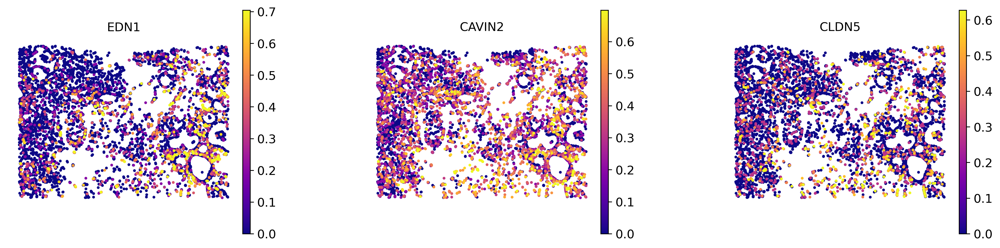

In [48]:
plot_endo = True
gene_list_stroma = ["EDN1", "CAVIN2", "CLDN5"]
percentiles_stroma = get_gene_percentiles_list(
    adata, gene_list_stroma, 99.9, layer="min_max_scaled"
)

for sample in adata.obs[setup.SAMPLE].unique().tolist()[:1]:
    sc.pl.spatial(
        adata=adata_astro[adata_astro.obs[setup.SAMPLE] == sample]
        if plot_endo
        else adata_not_endo[adata_not_endo.obs[setup.SAMPLE] == sample],
        spot_size=100 if plot_endo else 40,
        # color=g3_g1_genes,
        color=gene_list_stroma,
        frameon=False,
        show=False,
        use_raw=False,
        wspace=0.4,
        vmax=percentiles_stroma,
        # vmax="p99.5",
        layer="min_max_scaled",
        cmap="plasma",
    )

    # if plot_endo:
    #     plt.savefig(f"{figure_dir}_proseg_stroma_endo.svg", bbox_inches="tight", dpi=1000)
    # else:
    #     plt.savefig(f"{figure_dir}_proseg_stroma_not_endo.svg", bbox_inches="tight", dpi=1000)